In [1]:
from ultralytics import YOLO
import cv2
from IPython.display import Image
from matplotlib import pyplot as plt
import imutils
import cv2
import numpy as np
import pandas as pd
import os.path
import random

model = YOLO('best.pt')

FileNotFoundError: [Errno 2] No such file or directory: 'best.pt'

In [75]:
image = cv2.imread("./data/Rjpg.jpg")
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

res = model.predict(image, save_crop=True , project="runs" , name="cropped")

# for r in res:
#     boxes = r.boxes
#     for box in boxes:
#         x1,y1,x2,y2 = box.xyxy[0]
#         x1, y1, x2, y2 = int(x1),int(y1),int(x2),int(y2)
#         print(x1,y1,x2,y2)
#         cv2.rectangle(image,(x1,y1),(x2,y2),(225,0,225),3)

0: 960x1280 1 plate, 215.1ms
Speed: 20.2ms preprocess, 215.1ms inference, 1.0ms postprocess per image at shape (1, 3, 960, 1280)
Results saved to runs\cropped11


In [76]:
cap = cv2.imread("./runs/cropped11/crops/plate/image0.jpg")

In [77]:
imsize = cap.shape
confThreshold = 0.8  #Confidence threshold
nmsThreshold = 15  #Non-maximum suppression threshold

inpWidth = imsize[1]     #Width of network's input image
inpHeight = imsize[0]     #Height of network's input image


In [78]:
# Match contours to license plate or character template
def find_contours(dimensions, img) :

    # Find all contours in the image
    cntrs, _ = cv2.findContours(img.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    # Retrieve potential dimensions
    lower_width = dimensions[0]
    upper_width = dimensions[1]
    lower_height = dimensions[2]
    upper_height = dimensions[3]
    
    # Check largest 5 or  15 contours for license plate or character respectively
    cntrs = sorted(cntrs, key=cv2.contourArea, reverse=True)[:15]
    
    ii = cv2.imread('contour.jpg')
    
    x_cntr_list = []
    target_contours = []
    img_res = []
    for cntr in cntrs :
        # detects contour in binary image and returns the coordinates of rectangle enclosing it
        intX, intY, intWidth, intHeight = cv2.boundingRect(cntr)
        
        # checking the dimensions of the contour to filter out the characters by contour's size
        if intWidth > lower_width and intWidth < upper_width and intHeight > lower_height and intHeight < upper_height :
            x_cntr_list.append(intX) #stores the x coordinate of the character's contour, to used later for indexing the contours

            char_copy = np.zeros((44,24))
            # extracting each character using the enclosing rectangle's coordinates.
            char = img[intY:intY+intHeight, intX:intX+intWidth]
            char = cv2.resize(char, (20, 40))
            
            cv2.rectangle(ii, (intX,intY), (intWidth+intX, intY+intHeight), (50,21,200), 2)
            plt.imshow(ii, cmap='gray')
            plt.title('Predict Segments')

            # Make result formatted for classification: invert colors
            char = cv2.subtract(255, char)

            # Resize the image to 24x44 with black border
            char_copy[2:42, 2:22] = char
            char_copy[0:2, :] = 0
            char_copy[:, 0:2] = 0
            char_copy[42:44, :] = 0
            char_copy[:, 22:24] = 0

            img_res.append(char_copy) # List that stores the character's binary image (unsorted)
            
    # Return characters on ascending order with respect to the x-coordinate (most-left character first)
            
    plt.show()
    # arbitrary function that stores sorted list of character indeces
    indices = sorted(range(len(x_cntr_list)), key=lambda k: x_cntr_list[k])
    img_res_copy = []
    for idx in indices:
        img_res_copy.append(img_res[idx])# stores character images according to their index
    img_res = np.array(img_res_copy)

    return img_res

In [79]:
# Find characters in the resulting images
def segment_characters(image) :

    # Preprocess cropped license plate image
    img_lp = cv2.resize(image, (333, 75))
    img_gray_lp = cv2.cvtColor(img_lp, cv2.COLOR_BGR2GRAY)
    _, img_binary_lp = cv2.threshold(img_gray_lp, 200, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    img_binary_lp = cv2.erode(img_binary_lp, (3,3))
    img_binary_lp = cv2.dilate(img_binary_lp, (3,3))

    LP_WIDTH = img_binary_lp.shape[0]
    LP_HEIGHT = img_binary_lp.shape[1]

    # Make borders white
    img_binary_lp[0:3,:] = 255
    img_binary_lp[:,0:3] = 255
    img_binary_lp[72:75,:] = 255
    img_binary_lp[:,330:333] = 255

    # Estimations of character contours sizes of cropped license plates
    dimensions = [LP_WIDTH/6,
                       LP_WIDTH/2,
                       LP_HEIGHT/10,
                       2*LP_HEIGHT/3]
    plt.imshow(img_binary_lp, cmap='gray')
    plt.title('Contour')
    plt.show()
    cv2.imwrite('contour.jpg',img_binary_lp)

    # Get contours within cropped license plate
    char_list = find_contours(dimensions, img_binary_lp)

    return char_list

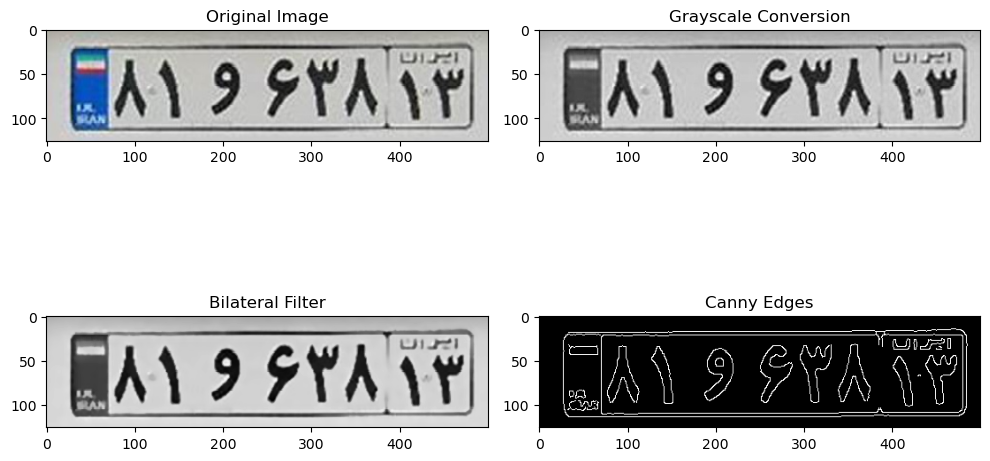

In [80]:
image = imutils.resize(cap, width=500)
img=cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display the original image
fig, ax = plt.subplots(2, 2, figsize=(10,7))
ax[0,0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
ax[0,0].set_title('Original Image')

# RGB to Gray scale conversion
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
ax[0,1].imshow(gray, cmap='gray')
ax[0,1].set_title('Grayscale Conversion')

# Noise removal with iterative bilateral filter(removes noise while preserving edges)
gray = cv2.bilateralFilter(gray, 11, 17, 17)
ax[1,0].imshow(gray, cmap='gray')
ax[1,0].set_title('Bilateral Filter')

# Find Edges of the grayscale image
edged = cv2.Canny(gray, 170, 200)
ax[1,1].imshow(edged, cmap='gray')
ax[1,1].set_title('Canny Edges')

fig.tight_layout()
plt.show()

# Find contours based on Edges
cnts = cv2.findContours(edged.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)[0]
cnts=sorted(cnts, key = cv2.contourArea, reverse = True)[:30] #sort contours based on their area keeping minimum required area as '30' (anything smaller than this will not be considered)
NumberPlateCnt = None #we currently have no Number plate contour

# loop over our contours to find the best possible approximate contour of number plate
count = 0
for c in cnts:
        peri = cv2.arcLength(c, True)
        approx = cv2.approxPolyDP(c, 0.02 * peri, True)
        if len(approx) == 4:  # Select the contour with 4 corners
            NumberPlateCnt = approx #This is our approx Number Plate Contour
            x,y,w,h = cv2.boundingRect(c)
            ROI = img[y:y+h, x:x+w]
            break

if NumberPlateCnt is not None:
    # Drawing the selected contour on the original image
    cv2.drawContours(image, [NumberPlateCnt], -1, (0,255,0), 3)

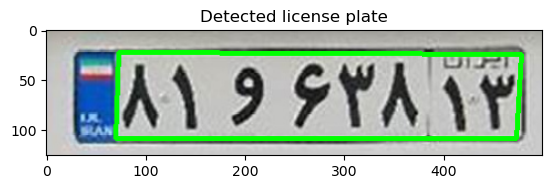

In [81]:
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title("Detected license plate")
plt.show()

In [82]:
print(NumberPlateCnt)

[[[479  24]]

 [[474 109]]

 [[ 70 109]]

 [[ 73  22]]]


In [83]:
def dist(x1, x2, y1, y2):
    return ((x1-x2)**2+(y1-y2)**2)**0.5

In [84]:
import math
idx=0
m=0
# To find the index of coordinate with maximum y-coordinate
for i in range(4):
    if NumberPlateCnt[i][0][1]>m:
        idx=i
        m=NumberPlateCnt[i][0][1]

# Assign index to the previous coordinate
if idx==0:
    pin=3
else:
    pin=idx-1

# Assign index to the next coordinate
if idx==3:
    nin=0
else:
    nin=idx+1

# Find distances between the acquired coordinate and its previous and next coordinate
p=dist(NumberPlateCnt[idx][0][0], NumberPlateCnt[pin][0][0], NumberPlateCnt[idx][0][1], NumberPlateCnt[pin][0][1])
n=dist(NumberPlateCnt[idx][0][0], NumberPlateCnt[nin][0][0], NumberPlateCnt[idx][0][1], NumberPlateCnt[nin][0][1])

# The coordinate that has more distance from the acquired coordinate is the required second bottom-most coordinate
if p>n:
    if NumberPlateCnt[pin][0][0]<NumberPlateCnt[idx][0][0]:
        left=pin
        right=idx
    else:
        left=idx
        right=pin
    d=p
else:
    if NumberPlateCnt[nin][0][0]<NumberPlateCnt[idx][0][0]:
        left=nin
        right=idx
    else:
        left=idx
        right=nin
    d=n
print(left, right)

2 1


In [85]:
left_x=NumberPlateCnt[left][0][0]
left_y=NumberPlateCnt[left][0][1]
right_x=NumberPlateCnt[right][0][0]
right_y=NumberPlateCnt[right][0][1]
print(left_x, left_y, right_x, right_y)

70 109 474 109


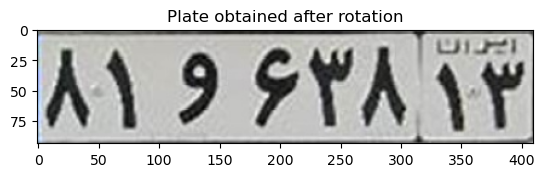

In [86]:
# Finding the angle of rotation by calculating sin of theta
opp=right_y-left_y
hyp=((left_x-right_x)**2+(left_y-right_y)**2)**0.5
sin=opp/hyp
theta=math.asin(sin)*57.2958

# Rotate the image according to the angle of rotation obtained
image_center = tuple(np.array(ROI.shape[1::-1]) / 2)
rot_mat = cv2.getRotationMatrix2D(image_center, theta, 1.0)
result = cv2.warpAffine(ROI, rot_mat, ROI.shape[1::-1], flags=cv2.INTER_LINEAR)

# The image can be cropped after rotation( since rotated image takes much more height)
if opp>0:
    h=result.shape[0]-opp//2
else:
    h=result.shape[0]+opp//2

result=result[0:h, :]
plt.imshow(result)
plt.title("Plate obtained after rotation")
plt.show()

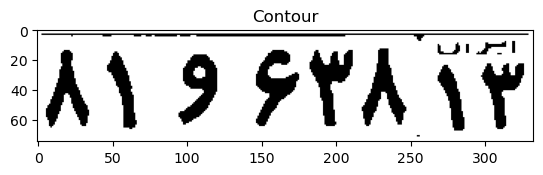

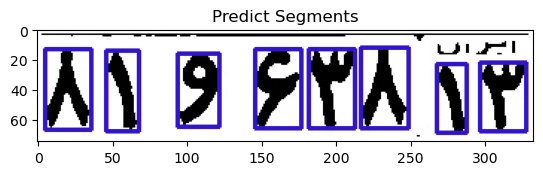

In [128]:

char=segment_characters(result)


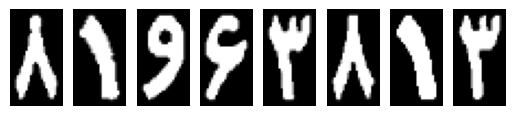

In [139]:
for i in range(len(char)):
    plt.subplot(1, len(char), i+1)
    plt.imshow(char[i], cmap='gray')
    plt.axis('off')
plt.show()

error: OpenCV(4.9.0) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\colormap.cpp:736: error: (-5:Bad argument) cv::ColorMap only supports source images of type CV_8UC1 or CV_8UC3 in function 'cv::colormap::ColorMap::operator ()'


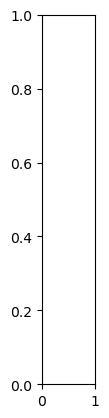

In [149]:
for i in range(len(char)):
    if i == 0 :
        pass
    else:
        plt.subplot(1, len(char), i+1)
        invert = cv2.bitwise_not(char[i]) # OR
        invert = 255 - invert
        plt.imshow(invert )
        plt.axis('off')
plt.show()

In [90]:
class_id = []
img_path = []
for index , foldername in enumerate(os.listdir("C:/Users/hosei/Documents/GIT/data/Iranis Dataset Files/")):
    for inner_index , filename in enumerate(os.listdir("C:/Users/hosei/Documents/GIT/data/Iranis Dataset Files/"+foldername)):
        class_id.append(foldername)
        img_path.append(filename)

In [91]:
for i in range(len(class_id)):
    print(f'class id = {class_id[i]} , file_name = {img_path[i]}' )

class id = 0 , file_name = 0 (1).jpg
class id = 0 , file_name = 0 (10).jpg
class id = 0 , file_name = 0 (100).jpg
class id = 0 , file_name = 0 (1000).jpg
class id = 0 , file_name = 0 (1001).jpg
class id = 0 , file_name = 0 (1002).jpg
class id = 0 , file_name = 0 (1003).jpg
class id = 0 , file_name = 0 (1004).jpg
class id = 0 , file_name = 0 (1005).jpg
class id = 0 , file_name = 0 (1006).jpg
class id = 0 , file_name = 0 (1007).jpg
class id = 0 , file_name = 0 (1008).jpg
class id = 0 , file_name = 0 (1009).jpg
class id = 0 , file_name = 0 (101).jpg
class id = 0 , file_name = 0 (1010).jpg
class id = 0 , file_name = 0 (1011).jpg
class id = 0 , file_name = 0 (1012).jpg
class id = 0 , file_name = 0 (1013).jpg
class id = 0 , file_name = 0 (1014).jpg
class id = 0 , file_name = 0 (1015).jpg
class id = 0 , file_name = 0 (1016).jpg
class id = 0 , file_name = 0 (1017).jpg
class id = 0 , file_name = 0 (1018).jpg
class id = 0 , file_name = 0 (1019).jpg
class id = 0 , file_name = 0 (102).jpg
class id

In [92]:
paths_data = zip(class_id , img_path)
paths_data = list(paths_data)
len(paths_data)

83844

In [93]:
import csv
with open('./CSV/meta.csv', 'r') as csvfile:
    reader = csv.reader(csvfile, delimiter=',')
    output = list(reader)

In [94]:
meta_list = output

In [95]:
path_df = pd.DataFrame(paths_data)

In [96]:
path_df.head()

,0,1
0,0,0 (1).jpg
1,0,0 (10).jpg
2,0,0 (100).jpg
3,0,0 (1000).jpg
4,0,0 (1001).jpg


In [97]:
meta = {'0':0,
'1':1,
'2':2,
'3':3,
'4':4,
'5':5,
'6':6,
'7':7,
'8':8,
'9':9,
'A':10,
'B':11,
'P':12,
'Gh':13,
'H':14,
'J':15,
'L':16,
'M':17,
'N':18,
'P':19,
'PuV':20,
'PwD':21,
'Sad':22,
'Sin':23,
'T':24,
'Taxi':25,
'V':26,
'Y':27,
'D':28}

In [98]:
list_index = []
list_filename = []
for index, row in path_df.iterrows():
    print(row[0])
    print(row[1])
    print("\n")
    row[0] = meta[row[0]]
    

0
0 (1).jpg


0
0 (10).jpg


0
0 (100).jpg


0
0 (1000).jpg


0
0 (1001).jpg


0
0 (1002).jpg


0
0 (1003).jpg


0
0 (1004).jpg


0
0 (1005).jpg


0
0 (1006).jpg


0
0 (1007).jpg


0
0 (1008).jpg


0
0 (1009).jpg


0
0 (101).jpg


0
0 (1010).jpg


0
0 (1011).jpg


0
0 (1012).jpg


0
0 (1013).jpg


0
0 (1014).jpg


0
0 (1015).jpg


0
0 (1016).jpg


0
0 (1017).jpg


0
0 (1018).jpg


0
0 (1019).jpg


0
0 (102).jpg


0
0 (1020).jpg


0
0 (1021).jpg


0
0 (1022).jpg


0
0 (1023).jpg


0
0 (1024).jpg


0
0 (1025).jpg


0
0 (1026).jpg


0
0 (1027).jpg


0
0 (1028).jpg


0
0 (1029).jpg


0
0 (103).jpg


0
0 (1030).jpg


0
0 (1031).jpg


0
0 (1032).jpg


0
0 (1033).jpg


0
0 (1034).jpg


0
0 (1035).jpg


0
0 (1036).jpg


0
0 (1037).jpg


0
0 (1038).jpg


0
0 (1039).jpg


0
0 (104).jpg


0
0 (1040).jpg


0
0 (1041).jpg


0
0 (1042).jpg


0
0 (1043).jpg


0
0 (1044).jpg


0
0 (1045).jpg


0
0 (1046).jpg


0
0 (1047).jpg


0
0 (1048).jpg


0
0 (1049).jpg


0
0 (105).jpg


0
0 (1050).jpg


0
0 (105

In [99]:
path_df_record = path_df.to_records()
path_df_record.tolist()
path_df_record = list(path_df_record)

In [100]:
path_df_record

[(0, 0, '0 (1).jpg'),
 (1, 0, '0 (10).jpg'),
 (2, 0, '0 (100).jpg'),
 (3, 0, '0 (1000).jpg'),
 (4, 0, '0 (1001).jpg'),
 (5, 0, '0 (1002).jpg'),
 (6, 0, '0 (1003).jpg'),
 (7, 0, '0 (1004).jpg'),
 (8, 0, '0 (1005).jpg'),
 (9, 0, '0 (1006).jpg'),
 (10, 0, '0 (1007).jpg'),
 (11, 0, '0 (1008).jpg'),
 (12, 0, '0 (1009).jpg'),
 (13, 0, '0 (101).jpg'),
 (14, 0, '0 (1010).jpg'),
 (15, 0, '0 (1011).jpg'),
 (16, 0, '0 (1012).jpg'),
 (17, 0, '0 (1013).jpg'),
 (18, 0, '0 (1014).jpg'),
 (19, 0, '0 (1015).jpg'),
 (20, 0, '0 (1016).jpg'),
 (21, 0, '0 (1017).jpg'),
 (22, 0, '0 (1018).jpg'),
 (23, 0, '0 (1019).jpg'),
 (24, 0, '0 (102).jpg'),
 (25, 0, '0 (1020).jpg'),
 (26, 0, '0 (1021).jpg'),
 (27, 0, '0 (1022).jpg'),
 (28, 0, '0 (1023).jpg'),
 (29, 0, '0 (1024).jpg'),
 (30, 0, '0 (1025).jpg'),
 (31, 0, '0 (1026).jpg'),
 (32, 0, '0 (1027).jpg'),
 (33, 0, '0 (1028).jpg'),
 (34, 0, '0 (1029).jpg'),
 (35, 0, '0 (103).jpg'),
 (36, 0, '0 (1030).jpg'),
 (37, 0, '0 (1031).jpg'),
 (38, 0, '0 (1032).jpg'),
 (39,

In [101]:
int(len(path_df)/5) #train / test split

16768

In [102]:
from tqdm import tqdm


In [103]:
final_data = []
for item in path_df_record:
    final_data.append(list(item))

In [104]:
for item in final_data:
    item.pop(0)

In [105]:
pd.DataFrame(final_data)

,0,1
0,0,0 (1).jpg
1,0,0 (10).jpg
2,0,0 (100).jpg
3,0,0 (1000).jpg
4,0,0 (1001).jpg
...,...,...
83839,27,Y (995).jpg
83840,27,Y (996).jpg
83841,27,Y (997).jpg
83842,27,Y (998).jpg


In [106]:
test_split_data = []
for i in tqdm(range(16000)):
    random_sample = random.choice(final_data)
    final_data.remove(random_sample)
    test_split_data.append(random_sample)


  0%|          | 0/16000 [00:00<?, ?it/s]

100%|██████████| 16000/16000 [00:10<00:00, 1523.09it/s]


In [107]:
len(test_split_data) + len(final_data)

83844

In [108]:
test_split_data

[[27, 'Y (1335).jpg'],
 [21, 'PwD (1983).jpg'],
 [10, 'A (1978).jpg'],
 [6, '6 (3591).jpg'],
 [19, 'P (410).jpg'],
 [20, 'PuV (324).jpg'],
 [6, '6 (4767).jpg'],
 [5, '5 (1705).jpg'],
 [4, '4 (2868).jpg'],
 [14, 'H (4).jpg'],
 [27, 'Y (1582).jpg'],
 [18, 'N (1125).jpg'],
 [3, '3 (1915).jpg'],
 [11, 'B (2320).jpg'],
 [10, 'A (946).jpg'],
 [15, 'J (1827).jpg'],
 [2, '2 (833).jpg'],
 [23, 'Sin (1513).jpg'],
 [6, '6 (1878).jpg'],
 [1, '1 (2564).jpg'],
 [7, '7 (2414).jpg'],
 [0, '0 (149).jpg'],
 [2, '2 (800).jpg'],
 [1, '1 (767).jpg'],
 [19, 'P (652).jpg'],
 [18, 'N (430).jpg'],
 [27, 'Y (1788).jpg'],
 [9, '9 (1321).jpg'],
 [22, 'Sad (1812).jpg'],
 [28, 'D (422).jpg'],
 [23, 'Sin (382).jpg'],
 [4, '4 (2813).jpg'],
 [27, 'Y (2169).jpg'],
 [15, 'J (1024).jpg'],
 [24, 'Ta (488).jpg'],
 [9, '9 (1951).jpg'],
 [26, 'V (1005).jpg'],
 [5, '5 (2533).jpg'],
 [6, '6 (5594).jpg'],
 [14, 'H (2401).jpg'],
 [20, 'PuV (1925).jpg'],
 [1, '1 (2669).jpg'],
 [24, 'Ta (1343).jpg'],
 [9, '9 (2878).jpg'],
 [18, 'N

In [109]:
train_split_data = final_data

In [110]:
train_csv = "./CSV/Plate_train.csv"
test_csv = "./CSV/Plate_test.csv"

In [111]:
import csv
with open (train_csv ,mode='w' , newline='') as csvfile:
    csvwriter = csv.writer(csvfile)
    table = ["class_id" , "path"]
    csvwriter.writerow(table)
    csvwriter.writerows(train_split_data)

In [112]:
with open (test_csv ,mode='w' , newline='') as csvfile:
    csvwriter = csv.writer(csvfile)
    table = ["class_id" , "path"]
    csvwriter.writerow(table)
    csvwriter.writerows(test_split_data)

In [113]:
# import shutil

# main_path = "C:/Users/hosei/Documents/GIT/data/Iranis Dataset Files/"
# paste_path = "C:/Users/hosei/Documents/GIT/data/All_characters/"


# for index , foldername in enumerate(os.listdir(main_path)):
#     copy_source_path = main_path+foldername+"/"
#     for image in os.listdir(copy_source_path):
#         shutil.copyfile(copy_source_path + image, paste_path + image)

In [114]:
train_df = pd.read_csv(train_csv)
test_df = pd.read_csv(test_csv)

In [115]:
import os
import random
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data import Dataset, DataLoader
import torchvision
from PIL import Image
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [116]:
device = torch.device('cuda')

In [117]:
device

device(type='cuda')

In [118]:
transforms = torchvision.transforms.Compose([torchvision.transforms.ToTensor() , torchvision.transforms.Resize((64,64))])

class Character_dataset(Dataset):
    def __init__(self, df, root_dir,transform=None):
        self.df = df
        self.root_dir = root_dir
        self.transform = transform
    
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self,index):
        image_path = os.path.join(self.root_dir,self.df.iloc[index,1])  #the column of paths in dataframe is 1
        image = Image.open(image_path)
        y_class = torch.tensor(self.df.iloc[index, 0]) #the column of ClsassId in daraframe is 0
        
        if self.transform:
            image = self.transform(image)
            return (image, y_class)

In [119]:
training_set = Character_dataset(train_df,"C:/Users/hosei/Documents/GIT/data/ALL_characters",transform=transforms)
test_set = Character_dataset(test_df,"C:/Users/hosei/Documents/GIT/data/ALL_characters",transform=transforms)

In [122]:
batch_size = 128

In [123]:
train_loader = DataLoader(dataset = training_set, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(dataset = test_set, batch_size=batch_size, shuffle=False)

dataloaders = {'training':train_loader,'testing':test_loader}
dataset_sizes = {'training':len(train_loader.dataset),'testing':len(test_loader.dataset)}
print(dataset_sizes)

{'training': 67844, 'testing': 16000}


c:\Users\hosei\anaconda3\lib\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


tensor(21)


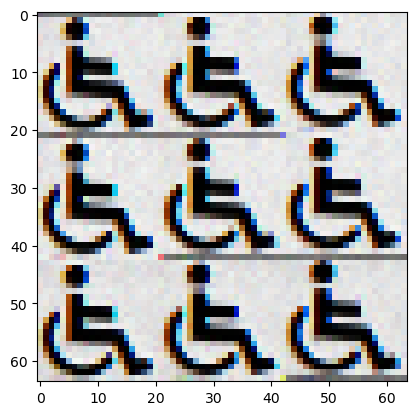

In [124]:
dataiter = iter(train_loader)
images, labels = next(dataiter)
image = images[0]
image.shape 

# torch.Size([3, 28, 28]) # pyplot doesn't like this, so reshape

image = image.reshape(-1,64,3)
plt.imshow(image.numpy())
print(labels[0])

In [157]:
class CHR_Model(nn.Module):
    def __init__(self, input_size, output_size):
        super(CHR_Model, self).__init__()
        self.input_size = input_size
        self.output_size = output_size
        self.relu = nn.LeakyReLU()
        self.flatten = nn.Flatten()

        self.dropout2 = nn.Dropout(0.2)
        self.dropout3 = nn.Dropout(0.3)
        self.maxpool = nn.MaxPool2d(kernel_size=4)
        
        self.conv1 = nn.Conv2d(in_channels=1 , out_channels=32 , kernel_size=3 , padding=1)
        self.conv2 = nn.Conv2d(in_channels=32 , out_channels=64 , kernel_size=3 , padding=1)
        self.batchnorm1 = nn.BatchNorm2d(64)
        
        self.conv3 = nn.Conv2d(in_channels=64 , out_channels=128 , kernel_size=3 , padding=1)
        self.conv4 = nn.Conv2d(in_channels=128 , out_channels=256 , kernel_size=3 , padding=1)
        self.batchnorm2 = nn.BatchNorm2d(256)
        
        # self.conv5 = nn.Conv2d(in_channels=256 , out_channels=512 , kernel_size=3 , padding=1)
        # self.conv6 = nn.Conv2d(in_channels=512 , out_channels=1028 , kernel_size=3 , padding=1)
        # self.batchnorm3 = nn.BatchNorm2d(1028)
        
        self.l1 = nn.Linear(4096,2048)
        self.l2 = nn.Linear(2048,1024)
        self.batchnorm4 = nn.LayerNorm(1024)
        # self.l3 = nn.Linear(4096,1024)
        # self.l4 = nn.Linear(1024,128)
        # self.batchnorm5 = nn.LayerNorm(128)
        self.l5 = nn.Linear(1024,output_size)
        
    def forward(self, input):
        
        conv1 = self.conv1(input)
        conv2 = self.conv2(conv1)
        batchnorm = self.batchnorm1(conv2)
        relu = self.relu(batchnorm)
        maxpool = self.maxpool(relu)
        
        conv3 = self.conv3(maxpool)
        conv4 = self.conv4(conv3)
        batchnorm = self.batchnorm2(conv4)
        relu = self.relu(batchnorm)
        maxpool = self.maxpool(relu)
        
        # conv5 = self.conv5(maxpool)
        # conv6 = self.conv6(conv5)
        # batchnorm = self.batchnorm2(conv6)
        # relu = self.relu(batchnorm)
        # maxpool = self.maxpool(relu)
        
        flatten = self.flatten(maxpool)
        
        #Neural Network Featuremap input
        dense_l1 = self.l1(flatten)
        dropout = self.dropout3(dense_l1)
        dense_l2 = self.l2(dropout)
        batchnorm = self.batchnorm4(dense_l2)
        dropout = self.dropout2(batchnorm)
        
        relu = self.relu(dropout)
        
        # dense_l3 = self.l3(relu)
        # dropout = self.dropout3(dense_l3)
        
        # relu = self.relu(dropout)
        
        # dense_l4 = self.l4(relu)
        # batchnorm = self.batchnorm5(dense_l4)
        dropout = self.dropout2(batchnorm)
        
        output = self.l5(dropout)
        
        return output

In [158]:
num_epochs = 20
# batch_size = 64
learning_rate = 0.001
input_size = 3*64*64
output_size = 29
model = CHR_Model(input_size=input_size, output_size=output_size)
model.cuda()

CHR_Model(
  (relu): LeakyReLU(negative_slope=0.01)
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (dropout2): Dropout(p=0.2, inplace=False)
  (dropout3): Dropout(p=0.3, inplace=False)
  (maxpool): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (batchnorm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (batchnorm2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (l1): Linear(in_features=4096, out_features=2048, bias=True)
  (l2): Linear(in_features=2048, out_features=1024, bias=True)
  (batchnorm4): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
  (l5): Linear(in_features

In [127]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adamax(model.parameters(), lr=learning_rate)

for epoch in range(num_epochs):
    for i, (images, labels) in enumerate(train_loader):
        # images, labels = images.type(torch.LongTensor), labels.type(torch.LongTensor)
        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)
        loss = criterion(outputs, labels)
        
        

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if (i+1) % 100 == 0:
            print(f'epoch {epoch+1} / {num_epochs}, step {i+1}, loss = {loss.item()}')

    with torch.no_grad():
        n_correct = 0
        n_samples = 0
        for images, labels in test_loader:
            images, labels = images.type(torch.cuda.FloatTensor), labels.type(torch.cuda.FloatTensor)
            labels = labels.to(device)
            outputs = model(images)

            _, predictions = torch.max(outputs, 1)
            n_samples +=labels.shape[0]
            n_correct +=(predictions == labels).sum().item()
        acc = 100.0 * (n_correct / n_samples)
        print(f'epoch {epoch+1} / {num_epochs}, accuracy = {acc}')

c:\Users\hosei\anaconda3\lib\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


epoch 1 / 20, step 100, loss = 0.9907629489898682
epoch 1 / 20, step 200, loss = 0.13121013343334198
epoch 1 / 20, step 300, loss = 0.05959489196538925
epoch 1 / 20, step 400, loss = 0.09878911823034286
epoch 1 / 20, step 500, loss = 0.03222886845469475
epoch 1 / 20, accuracy = 99.2
epoch 2 / 20, step 100, loss = 0.028134696185588837
epoch 2 / 20, step 200, loss = 0.03445645421743393
epoch 2 / 20, step 300, loss = 0.013704472221434116
epoch 2 / 20, step 400, loss = 0.01420685090124607
epoch 2 / 20, step 500, loss = 0.016437746584415436
epoch 2 / 20, accuracy = 99.34375
epoch 3 / 20, step 100, loss = 0.0610007680952549
epoch 3 / 20, step 200, loss = 0.01926310732960701
epoch 3 / 20, step 300, loss = 0.005941643845289946
epoch 3 / 20, step 400, loss = 0.021692736074328423
epoch 3 / 20, step 500, loss = 0.014311596751213074
epoch 3 / 20, accuracy = 98.99375
epoch 4 / 20, step 100, loss = 0.005996203050017357
epoch 4 / 20, step 200, loss = 0.0013177727814763784
epoch 4 / 20, step 300, loss

In [159]:
torch.save(model.state_dict() , "./model/model.pth.tar")

In [160]:
images, labels = images.type(torch.cuda.FloatTensor), labels.type(torch.cuda.FloatTensor)
labels = labels.to(device)
outputs = model(images)

_, predictions = torch.max(outputs, 1)

RuntimeError: Given groups=1, weight of size [32, 1, 3, 3], expected input[128, 3, 64, 64] to have 1 channels, but got 3 channels instead

In [161]:
for i in range(len(char)):
    # invert = cv2.bitwise_not(char[i]) # OR
    # invert = 255 - invert
    invert = char[i]
    
    a = torch.Tensor(invert)

    a.unsqueeze_(-1)
    print(a.shape)
    output = model(a)

torch.Size([44, 24, 1])


RuntimeError: Given groups=1, weight of size [32, 1, 3, 3], expected input[1, 44, 24, 1] to have 1 channels, but got 44 channels instead